<a href="https://colab.research.google.com/github/jsansao/dlvc/blob/main/Licao13_Xadrez_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lição 13 - Peças de Xadrez

Vamos detectar as peças de xadrez em um tabuleiro. São 14 categorias de peças no conjunto de treinamento. 

O dataset foi disponibilizado pela roboflow.


# Install Detectron2 Dependencies

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-l0depc_e
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-l0depc_e
1.5.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Import and Register Custom Detectron2 Data

In [4]:
!wget https://github.com/jsansao/ChessPiecesv23/archive/refs/heads/main.zip -O ChessPieces.zip

--2021-11-09 03:36:00--  https://github.com/jsansao/ChessPiecesv23/archive/refs/heads/main.zip
Resolving github.com (github.com)... 192.30.255.113
Connecting to github.com (github.com)|192.30.255.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/jsansao/ChessPiecesv23/zip/refs/heads/main [following]
--2021-11-09 03:36:01--  https://codeload.github.com/jsansao/ChessPiecesv23/zip/refs/heads/main
Resolving codeload.github.com (codeload.github.com)... 52.68.31.213
Connecting to codeload.github.com (codeload.github.com)|52.68.31.213|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘ChessPieces.zip’

ChessPieces.zip         [               <=>  ]  77.02M  25.8MB/s    in 3.0s    

2021-11-09 03:36:04 (25.8 MB/s) - ‘ChessPieces.zip’ saved [80760571]



In [5]:
!unzip ChessPieces.zip 

Archive:  ChessPieces.zip
246442c35465cdc9c917cdd0aa36698320def063
   creating: ChessPiecesv23-main/
  inflating: ChessPiecesv23-main/README.dataset.txt  
 extracting: ChessPiecesv23-main/README.md  
  inflating: ChessPiecesv23-main/README.roboflow.txt  
   creating: ChessPiecesv23-main/test/
  inflating: ChessPiecesv23-main/test/0b47311f426ff926578c9d738d683e76_jpg.rf.0b55f43ac16aa65c889558d8ea757072.jpg  
  inflating: ChessPiecesv23-main/test/1c0060ef868bdc326ce5e6389cb6732f_jpg.rf.9ce88078ea356949f4ab7ad9cfdfc62d.jpg  
  inflating: ChessPiecesv23-main/test/2f6fb003bb89cd401322a535acb42f65_jpg.rf.91ad9df05bd1f86bab67c8368ae5e4ad.jpg  
  inflating: ChessPiecesv23-main/test/410993714e325a1de3e394ffe860df3a_jpg.rf.519bf0fdbd5e38cd44cae1cfebc98536.jpg  
  inflating: ChessPiecesv23-main/test/4e3117459d759798537eb52cf5bf534d_jpg.rf.5b99421bf416463a8c75cfd07f8a68d1.jpg  
  inflating: ChessPiecesv23-main/test/5a35ba2ec3e0d0b2b12b1758a8ac29aa_jpg.rf.a907af85301c729635d6ab1c31eb31b2.jpg  
  in

In [4]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/ChessPiecesv23-main/train/_annotations.coco.json", "/content/ChessPiecesv23-main/train/")
register_coco_instances("my_dataset_val", {}, "/content/ChessPiecesv23-main/valid/_annotations.coco.json", "/content/ChessPiecesv23-main/valid/")
register_coco_instances("my_dataset_test", {}, "/content/ChessPiecesv23-main/test/_annotations.coco.json", "/content/ChessPiecesv23-main/test/")


WARNING [11/09 03:46:02 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/09 03:46:02 d2.data.datasets.coco]: Loaded 202 images in COCO format from /content/ChessPiecesv23-main/train/_annotations.coco.json


['pieces',
 'bishop',
 'black-bishop',
 'black-king',
 'black-knight',
 'black-pawn',
 'black-queen',
 'black-rook',
 'white-bishop',
 'white-king',
 'white-knight',
 'white-pawn',
 'white-queen',
 'white-rook']

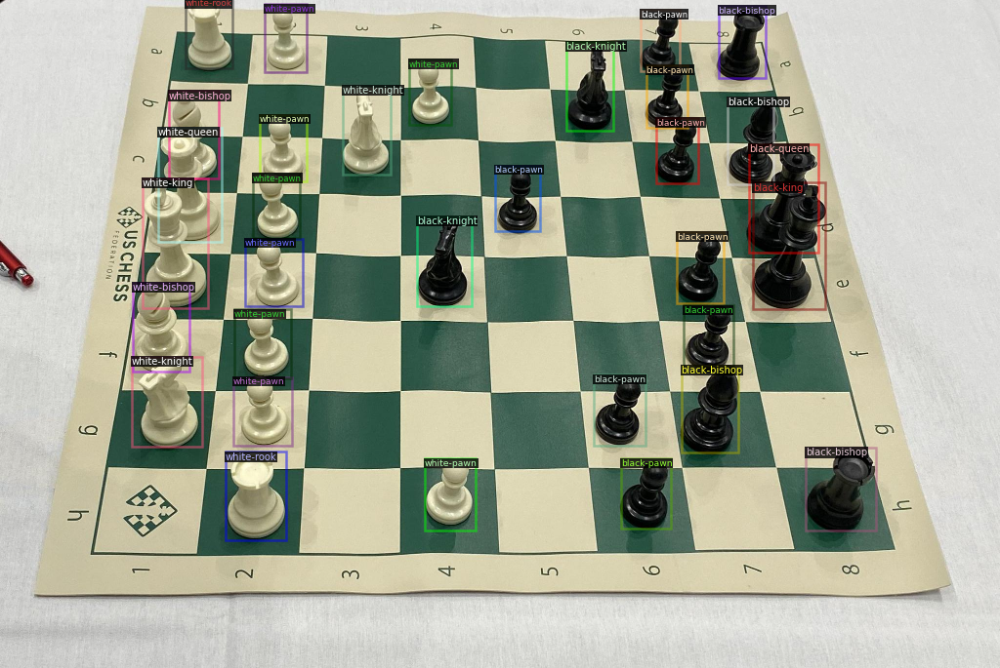

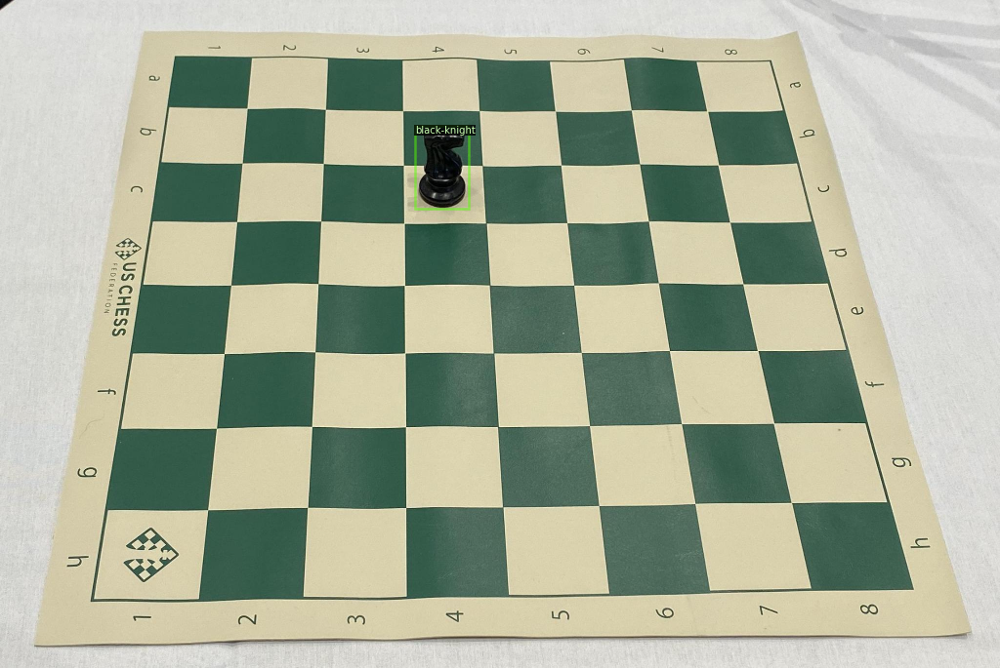

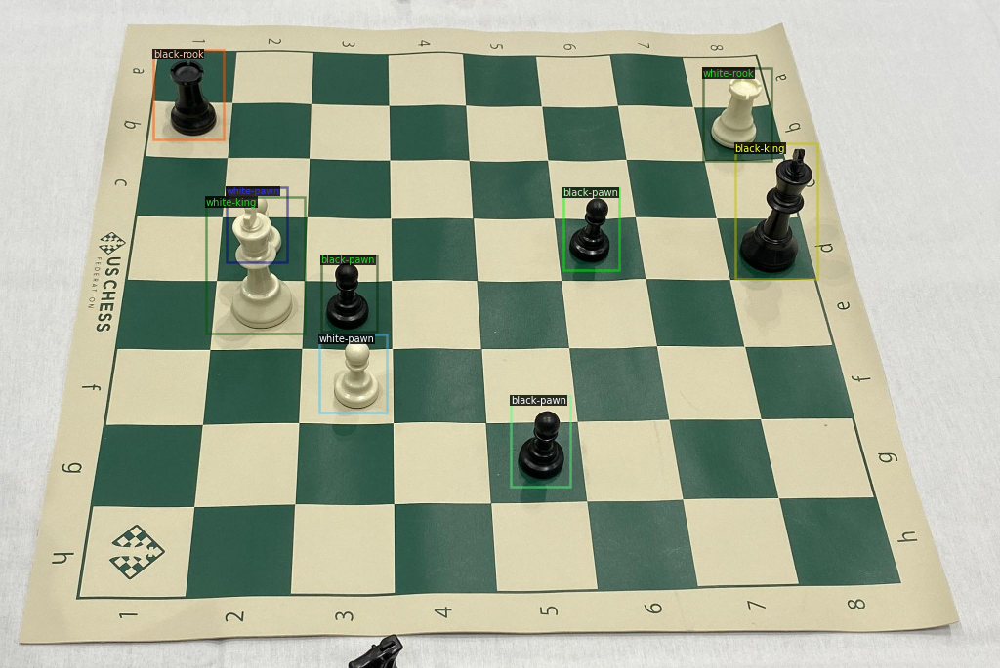

In [5]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")


display(my_dataset_train_metadata.thing_classes)

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [6]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [7]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
#COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml 
#Original: COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 100
cfg.SOLVER.MAX_ITER = 300 #adjust up if val mAP is still rising, adjust down if overfit
#cfg.SOLVER.STEPS = (100, 150)
#cfg.SOLVER.GAMMA = 0.05
cfg.SOLVER.STEPS = []



cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 14 #your number of classes

cfg.TEST.EVAL_PERIOD = 100


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/09 03:46:49 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (15, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (15,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (56, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (56,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias

[11/09 03:46:51 d2.engine.train_loop]: Starting training from iteration 0
[11/09 03:47:17 d2.utils.events]:  eta: 0:06:11  iter: 19  total_loss: 2.928  loss_cls: 2.217  loss_box_reg: 0.626  loss_rpn_cls: 0.019  loss_rpn_loc: 0.046  time: 1.3151  data_time: 0.0281  lr: 0.000191  max_mem: 2520M
[11/09 03:47:42 d2.utils.events]:  eta: 0:05:34  iter: 39  total_loss: 1.575  loss_cls: 0.817  loss_box_reg: 0.738  loss_rpn_cls: 0.002  loss_rpn_loc: 0.026  time: 1.2870  data_time: 0.0064  lr: 0.000391  max_mem: 2520M
[11/09 03:48:08 d2.utils.events]:  eta: 0:05:13  iter: 59  total_loss: 1.630  loss_cls: 0.800  loss_box_reg: 0.809  loss_rpn_cls: 0.001  loss_rpn_loc: 0.045  time: 1.2906  data_time: 0.0066  lr: 0.000590  max_mem: 2520M
[11/09 03:48:33 d2.utils.events]:  eta: 0:04:43  iter: 79  total_loss: 1.513  loss_cls: 0.695  loss_box_reg: 0.793  loss_rpn_cls: 0.001  loss_rpn_loc: 0.021  time: 1.2791  data_time: 0.0065  lr: 0.000790  max_mem: 2520M
WARNING [11/09 03:48:59 d2.data.datasets.coco]

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [8]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [11/09 03:56:33 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/09 03:56:33 d2.data.datasets.coco]: Loaded 29 images in COCO format from /content/ChessPiecesv23-main/test/_annotations.coco.json
[11/09 03:56:33 d2.data.build]: Distribution of instances among all 14 categories:
|  category   | #instances   |   category   | #instances   |   category   | #instances   |
|:-----------:|:-------------|:------------:|:-------------|:------------:|:-------------|
|   pieces    | 0            |    bishop    | 0            | black-bishop | 21           |
| black-king  | 17           | black-knight | 25           |  black-pawn  | 86           |
| black-queen | 14           |  black-rook  | 26           | white-bishop | 25           |
| white-king  | 15           | white-knight | 25           |  white-pawn  | 88           |
| white-queen | 14           |  white-rook  | 20           |              |              |
|    tot

OrderedDict([('bbox',
              {'AP': 56.20122729044487,
               'AP-bishop': nan,
               'AP-black-bishop': 29.172583882329974,
               'AP-black-king': 39.04691183404054,
               'AP-black-knight': 61.08766815300456,
               'AP-black-pawn': 69.5936924396592,
               'AP-black-queen': 69.36428943646244,
               'AP-black-rook': 70.76976374107998,
               'AP-pieces': nan,
               'AP-white-bishop': 61.97806992237685,
               'AP-white-king': 61.7004431212352,
               'AP-white-knight': 55.67765205091938,
               'AP-white-pawn': 67.32483167983338,
               'AP-white-queen': 39.25756116432487,
               'AP-white-rook': 49.44126006007195,
               'AP50': 92.11157717274794,
               'AP75': 63.14689927350421,
               'APl': 56.22557377775367,
               'APm': nan,
               'APs': nan})])

# Inference with Detectron2 Saved Weights



In [9]:
%ls ./output/

coco_instances_results.json                        instances_predictions.pth
events.out.tfevents.1636429136.67a7919f8939.77.0   last_checkpoint
events.out.tfevents.1636429208.67a7919f8939.77.1   metrics.json
events.out.tfevents.1636429610.67a7919f8939.361.0  model_final.pth


In [12]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/ChessPiecesv23-main/test/*.jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.5
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
